# ICTP_Mosquito_WingBeat_Sound_Classification_TinyML
- TinyML - Edge Impulse Model Training analysis 
- M.Rovai @30Nov2021

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.fftpack
import librosa
import librosa.display
import IPython.display

## Analizyng Audio raw sample

- From Edge Impulse Studio `Data Aquisition - Export Data` Tab, download to your computer a zip file with the .wav raw data captured.
- Upload on /content one (or more) .wav samples

### Aedes Aegypti

In [2]:
# @ CoLab
!ls /content

sample_data


In [3]:
# @ CoLab
sound_path = '/content/file_name'

In [ ]:
# @ Mac
#!ls ../data/dataset/aedes_aegypti

16khz_0_10130f.wav                   16khz_1_11-16-2016-111839 10130f.wav
16khz_0_11-16-2016-111457 10130f.wav 16khz_2_10130f.wav
16khz_0_11-16-2016-111839 10130f.wav 16khz_2_11-16-2016-111839 10130f.wav
16khz_1_10130f.wav                   16khz_3_10130f.wav
16khz_1_11-16-2016-111457 10130f.wav 16khz_3_11-16-2016-111839 10130f.wav


In [ ]:
file_path = '/content/'
file = '16khz_1_10130f.wav'

In [ ]:
audio, sr = librosa.load(file_path+file, sr=16_000)
sr

16000

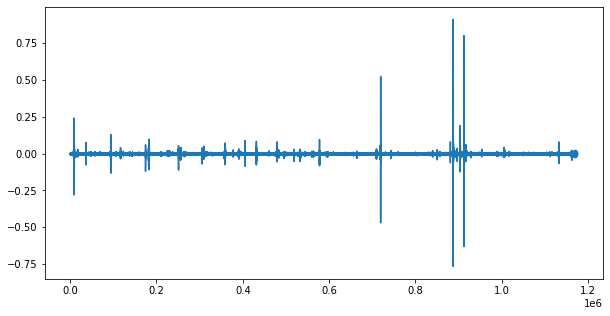

In [ ]:
plt.figure(figsize=(10, 5))
plt.plot(audio);

In [ ]:
IPython.display.Audio(data=audio, rate=sr)

In [ ]:
def fft(file_path, file, title = '', sr=16_000):  
    audio, sr = librosa.load(file_path+file, sr=sr)
    plt.figure(figsize=(10, 5))
    plt.plot(audio);
    plt.xlabel('time')
    plt.ylabel('amp')
    plt.grid(True)
    plt.title(title+' sample - Time Domain')
    
    plt.figure(figsize=(10, 5))
    for x in range (0, len(audio)-sr, sr//4):
        sample = audio[x:(x+16000)]
        yf = scipy.fftpack.fft(sample)
        plt.plot(2.0/sr * np.abs(yf[1:sr//8]))
    plt.xlabel('frequency [Hz]')
    plt.ylabel('amp')
    plt.grid(True)
    plt.title(title+' sample - Frequency Components')
    return audio, sr

In [ ]:
audio

array([-0.00537109, -0.00521851, -0.00482178, ..., -0.0010376 ,
        0.00039673, -0.0022583 ], dtype=float32)

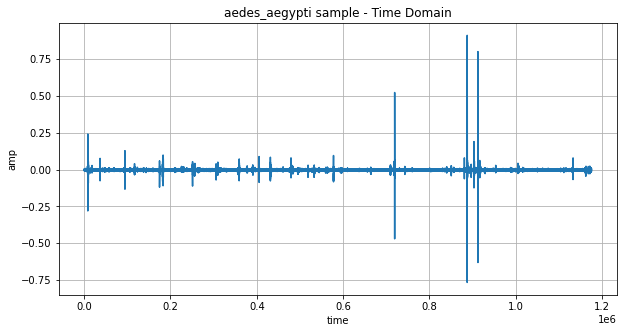

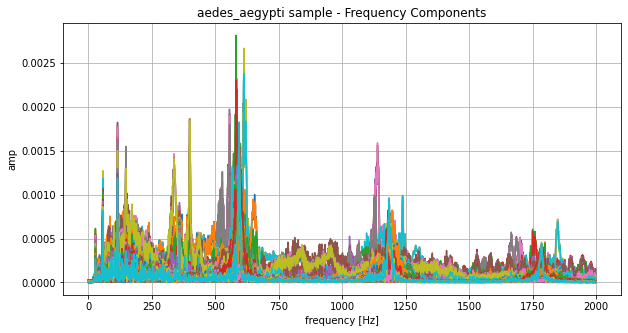

In [ ]:
audio, sr = fft(file_path, file, title = 'aedes_aegypti')

In [ ]:
def spectogram(audio, title='', sr=sr):
    X = librosa.stft(audio)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(10, 5))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.title(title+' sample - Spectogram')
    plt.colorbar();

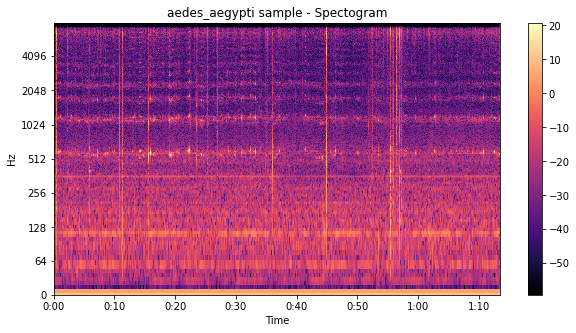

In [ ]:
spectogram(audio, title='aedes_aegypti')

### Aedes Albopictus

In [ ]:
!ls ../data/dataset/aedes_albopictus

16khz_0_11-16-2016-125240 albopictus f.wav
16khz_0_albof.wav
16khz_1_11-16-2016-125240 albopictus f.wav
16khz_1_albof.wav
16khz_2_11-16-2016-125240 albopictus f.wav
16khz_2_albof.wav
16khz_3_11-16-2016-125240 albopictus f.wav
16khz_3_albof.wav
16khz_4_11-16-2016-125240 albopictus f.wav
16khz_4_albof.wav


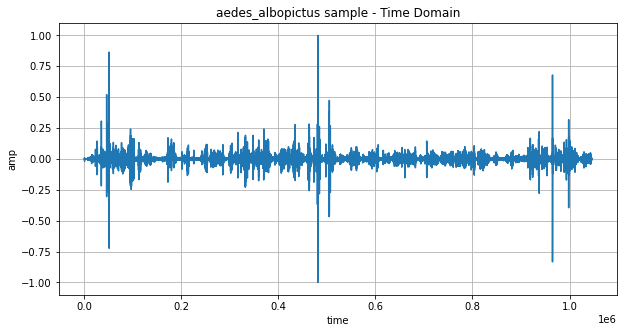

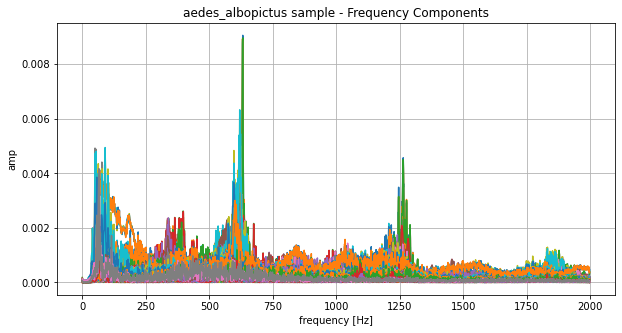

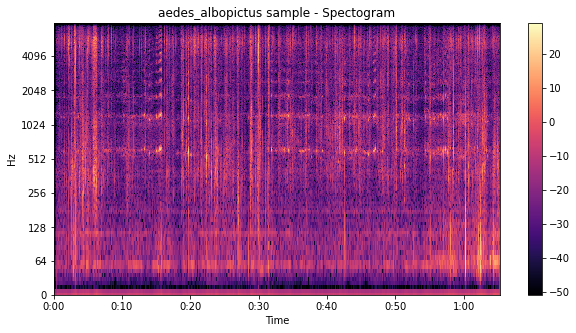

In [ ]:
file_path = '../data/dataset/aedes_albopictus/'
file = '16khz_0_11-16-2016-125240 albopictus f.wav'
audio, sr = fft(file_path, file, title = 'aedes_albopictus')
spectogram(audio, title='aedes_albopictus')

## Analysing Edge Impulse Model Training

Download the data - after extracting features through a processing block - so we can train a machine learning model.

In [ ]:
import numpy as np
import requests

API_KEY = 'ei_f5a6a812c273d90b3921c6e95313a7e8c1b866acb152078eda3e1ce1a03bfd80'

def download_data(url):
    response = requests.get(url, headers={'x-api-key': API_KEY})
    if response.status_code == 200:
        return response.content
    else:
        print(response.content)
        raise ConnectionError('Could not download data file')

X = download_data('https://studio.edgeimpulse.com/v1/api/65237/training/5/x')
Y = download_data('https://studio.edgeimpulse.com/v1/api/65237/training/5/y')


Store the data in a temporary file, and load it back through Numpy.

In [ ]:
with open('x_train.npy', 'wb') as file:
    file.write(X)
with open('y_train.npy', 'wb') as file:
    file.write(Y)
X = np.load('x_train.npy')
Y = np.load('y_train.npy')[:,0]

In [ ]:
X.shape, Y.shape

((8403, 5135), (8403,))

In [ ]:
image = X[1000]
img_length = image.shape[0]
img_length

5135

In [ ]:
columns = 65
rows = int(img_length / columns)
image = np.reshape(image, (rows, columns))
image.shape

(79, 65)

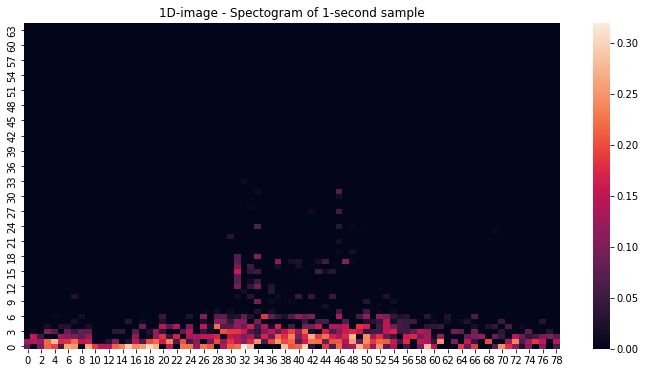

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12,6))
#sns.heatmap(image.T)
ax = sns.heatmap(image.T)
ax.invert_yaxis()
plt.title('1D-image - Spectogram of 1-second sample');

Define our labels and split the data up in a test and training set:

In [ ]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard

In [ ]:
import sys, os, random
from datetime import datetime
import tensorflow as tf
import tensorboard
from sklearn.model_selection import train_test_split

# Clear any logs from previous runs
#rm -rf ./logs/

# import logging
# tf.get_logger().setLevel(logging.ERROR)
# os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'

# Set random seeds for repeatable results
RANDOM_SEED = 3
random.seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)
tf.random.set_seed(RANDOM_SEED)

classes_values = [ "aegypti", "albopictus", "noise", "other" ]
classes = len(classes_values)

Y = tf.keras.utils.to_categorical(Y - 1, classes)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=1)

input_length = X_train[0].shape[0]

train_dataset = tf.data.Dataset.from_tensor_slices((X_train, Y_train))
validation_dataset = tf.data.Dataset.from_tensor_slices((X_test, Y_test))

In [ ]:
def get_reshape_function(reshape_to):
    def reshape(image, label):
        return tf.reshape(image, reshape_to), label
    return reshape

In [ ]:
# Define the Keras TensorBoard callback.
logdir="logs/fit/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

In [ ]:
from tensorflow.keras.callbacks import EarlyStopping
early_stop = EarlyStopping(monitor='val_loss', 
                           mode='min', 
                           verbose=1, 
                           patience=5)

callbacks = [early_stop, tensorboard_callback]

Train the model:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, InputLayer, Dropout, Conv1D, Conv2D, Flatten, Reshape, MaxPooling1D, MaxPooling2D, BatchNormalization, TimeDistributed
from tensorflow.keras.optimizers import Adam

# model architecture
model = Sequential()
model.add(Reshape((int(input_length / 65), 65), input_shape=(input_length, )))
model.add(Conv1D(32, kernel_size=3, activation='relu', padding='same'))
model.add(MaxPooling1D(pool_size=2, strides=2, padding='same'))
model.add(Conv1D(64, kernel_size=3, activation='relu', padding='same'))
model.add(MaxPooling1D(pool_size=2, strides=2, padding='same'))
model.add(Flatten())
model.add(Dropout(0.5))
model.add(Dense(classes, activation='softmax', name='y_pred'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 reshape (Reshape)           (None, 79, 65)            0         
                                                                 
 conv1d (Conv1D)             (None, 79, 32)            6272      
                                                                 
 max_pooling1d (MaxPooling1D  (None, 40, 32)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 40, 64)            6208      
                                                                 
 max_pooling1d_1 (MaxPooling  (None, 20, 64)           0         
 1D)                                                             
                                                                 
 flatten (Flatten)           (None, 1280)              0

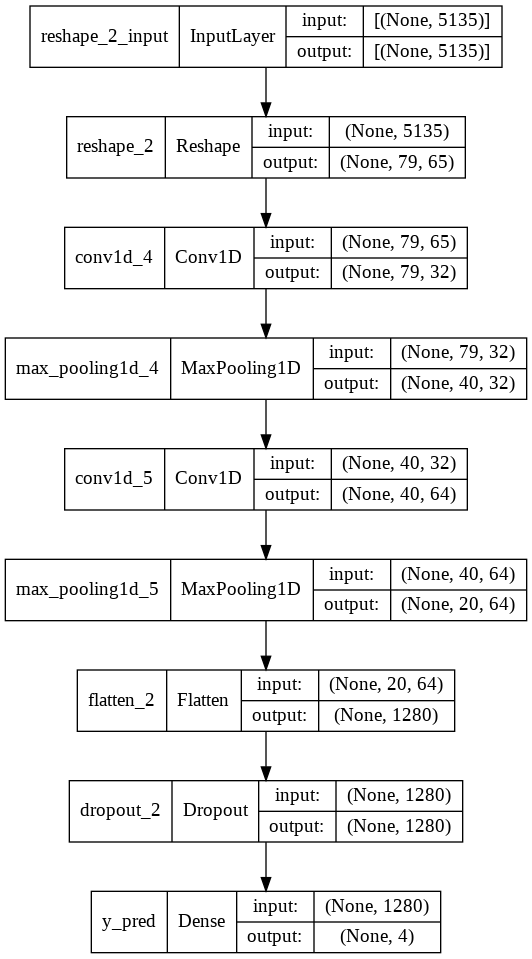

In [ ]:
tf.keras.utils.plot_model(
    model,
    to_file="model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=True,
    dpi=96,
    layer_range=None,
)

In [ ]:
LR = 0.001
BS = 32
EPOCHS = 100

In [ ]:
# this controls the learning rate
opt = Adam(lr=LR, beta_1=0.9, beta_2=0.999)
# this controls the batch size, or you can manipulate the tf.data.Dataset objects yourself
BATCH_SIZE = BS
train_dataset = train_dataset.batch(BATCH_SIZE, drop_remainder=False)
validation_dataset = validation_dataset.batch(BATCH_SIZE, drop_remainder=False)

# train the neural network
model.compile(loss='categorical_crossentropy',
              optimizer=opt,
              metrics=['accuracy'])

history = model.fit(train_dataset,
                    epochs=EPOCHS,
                    validation_data=validation_dataset,
                    verbose=2,
                    callbacks=callbacks)

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/100
211/211 - 4s - loss: 0.9268 - accuracy: 0.5546 - val_loss: 0.6366 - val_accuracy: 0.7365 - 4s/epoch - 18ms/step
Epoch 2/100
211/211 - 3s - loss: 0.5366 - accuracy: 0.7916 - val_loss: 0.4511 - val_accuracy: 0.8293 - 3s/epoch - 13ms/step
Epoch 3/100
211/211 - 3s - loss: 0.3958 - accuracy: 0.8575 - val_loss: 0.3768 - val_accuracy: 0.8548 - 3s/epoch - 13ms/step
Epoch 4/100
211/211 - 3s - loss: 0.3291 - accuracy: 0.8838 - val_loss: 0.3310 - val_accuracy: 0.8763 - 3s/epoch - 12ms/step
Epoch 5/100
211/211 - 3s - loss: 0.2848 - accuracy: 0.8985 - val_loss: 0.3037 - val_accuracy: 0.8870 - 3s/epoch - 13ms/step
Epoch 6/100
211/211 - 3s - loss: 0.2567 - accuracy: 0.9063 - val_loss: 0.2938 - val_accuracy: 0.8846 - 3s/epoch - 12ms/step
Epoch 7/100
211/211 - 3s - loss: 0.2319 - accuracy: 0.9165 - val_loss: 0.2668 - val_accuracy: 0.8965 - 3s/epoch - 12ms/step
Epoch 8/100
211/211 - 3s - loss: 0.2124 - accuracy: 0.9247 - val_loss: 0.2531 - val_accuracy: 0.9084 - 3s/epoch - 13ms/step
Epoch 9/

In [ ]:
%tensorboard --logdir logs

Reusing TensorBoard on port 6006 (pid 740), started 0:55:02 ago. (Use '!kill 740' to kill it.)

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
def plot_result(history, res= 'loss'):
    plt.plot(history.history[res])
    plt.plot(history.history['val_'+res])
    plt.title(res+' vs. epochs')
    plt.ylabel(res)
    plt.xlabel('Epoch')
    if res == 'loss':
        plt.legend(['Training', res], loc='upper right')
    else:
        plt.legend(['Training', 'Validation'], loc='lower right')
    plt.show()

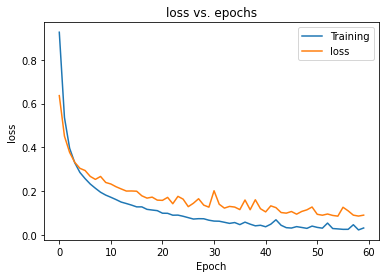

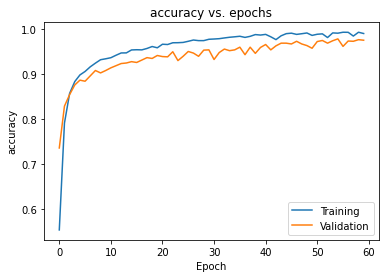

In [ ]:
plot_result(history, res= 'loss')
plot_result(history, res= 'accuracy')

In [ ]:
# Save the model to disk
model.save('saved_model')